###                                                        House Price Prediction  Assignment Part I

                                                                                        Developer: Sudhasrinivas Pallam

### Problem Statement :
    A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.
 
    The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.


<b>The company wants to know:</b>

    1) Which variables are significant in predicting the price of a house, and

    2) How well those variables describe the price of a house.

 Also, determine the optimal value of <b>lambda</b> for <b>ridge</b> and <b>lasso</b> regression. 

<b>Business Goal: </b> 

    We are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. 
    
    They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. 
    
    Further, the model will be a good way for management to understand the pricing dynamics of a new market.

### Steps to follow :
    1. Import csv and analyse the data (Info, describe, shape e.t.c)    
    2. Check no of categorical / Numerical(discrete, continuous) variables and if need change the data types
    3. Exploratory Data Analysis
        a. Target Varaible Analysis
        b. Univarient Analysis
        c. Bivariaent Analysis
    4. Feature Engineering
            a. Check null values and impute missing values 
            b. Check the outlier data
            c. Binning if required
            d. Log Transform
            e. One-Hot Encoding / dummies
            f. Grouping Operations
            g. Feature Split
            h. Scaling
    5. RFE for feature elimination
    6. Model Creations using Lasso and Ridge 

### Imports

In [1]:
#import basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#import model creation related libraries
from sklearn import linear_model, metrics
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

from scipy import stats

import os

# hide warnings
import warnings
warnings.filterwarnings('ignore')

#To display all the columns
pd.pandas.set_option('display.max_columns',None)

###  1. Import csv and analyse the data (Info, describe, shape e.t.c)   

In [2]:
#path for the data file 
path = "train.csv"

In [3]:
#Read and create Dataframe 
master_df = pd.read_csv(path)

In [4]:
#checks the rows and columns 
master_df.shape

(1460, 81)

Total 1460 rows and 81 columns, imported from train.csv

In [5]:
#check the features in the dataframe and their dtypes
master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

Total 43 Categorical Features, 38 Numerical Features as per info

In [6]:
master_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [7]:
master_df.head(20)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

<b>Observations: </b>
    1. Total 1460 rows and 81 columns, imported from train.csv
    2. Total 43 Categorical Features, 38 Numerical Features as per info
    3. As per the describe() --> features  MSSubClass, LotFrontage, LotArea, BsmtFinSF1, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, GrLivArea, SalePrice seems to have potential outlier data 


### 2. Check no of categorical / Numerical(discrete, continuous) variables and if need change the data types

In [8]:
#Categorical Feature names
categorical_features = [feature for feature in master_df.columns if master_df[feature].dtypes=='object']

print("Length of the features: ",len(categorical_features))
categorical_features


Length of the features:  43


['MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SaleType',
 'SaleCondition']

In [9]:
#Numerical Feature names
num_features = [feature for feature in master_df.columns if master_df[feature].dtype !='O']
print("Length of the Numerical features: ",len(num_features))
num_features

Length of the Numerical features:  38


['Id',
 'MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SalePrice']

In [10]:
#In continuous variables we observe 4 --> year based features, so extract it and analyse it 
year_features = [feature for feature in num_features if('Yr' in feature or 'Year' in feature )]

year_features

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

In [11]:
#discrete_feature

discrete_features = [feature for feature in num_features if len(master_df[feature].unique())<25 and feature not in year_features + ['Id']]

print("Length of the discrete features: ",len(discrete_features))

discrete_features

Length of the discrete features:  17


['MSSubClass',
 'OverallQual',
 'OverallCond',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 '3SsnPorch',
 'PoolArea',
 'MiscVal',
 'MoSold']

In [12]:
exc_features = discrete_features + year_features 
exc_features

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 '3SsnPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YearBuilt',
 'YearRemodAdd',
 'GarageYrBlt',
 'YrSold']

In [13]:
continuous_features = [feature for feature in num_features if(feature not in exc_features)]

print("Length of the continuous features: ",len(continuous_features))

continuous_features

Length of the continuous features:  17


['Id',
 'LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 'ScreenPorch',
 'SalePrice']

<b>Observations:</b>
    1. Categorical Features --> 43
    2. Numerical Features : 37 ( 17+16+4 )
        a. Discrete Features --> 17
        b. Continous Features --> 16
        c. Year Features --> 4

### 3. Exploratory Data Analysis

### a. SalePrice Distribution and analysis 

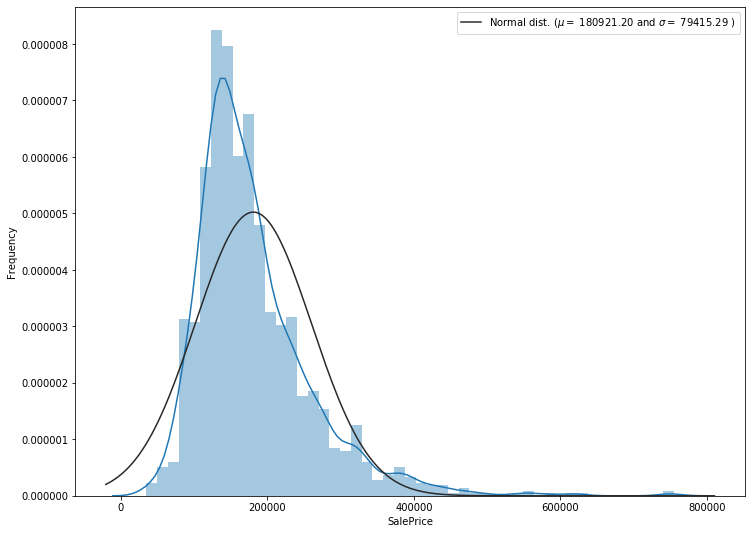

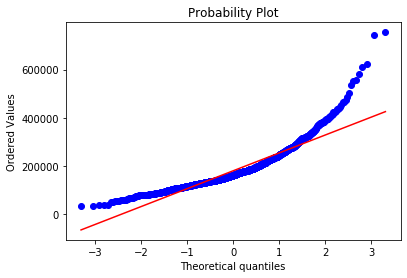

In [14]:
#Sale Price feature analyss

plt.subplots(figsize=(12,9))
sns.distplot(master_df['SalePrice'], fit=stats.norm)

# Get the fitted parameters used by the function

(mu, sigma) = stats.norm.fit(master_df['SalePrice'])

# plot with the distribution

plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
plt.ylabel('Frequency')

#Probablity plot

fig = plt.figure()
stats.probplot(master_df['SalePrice'], plot=plt)
plt.show()

<b>Observation: </b>

    From the above plots we can clearly observe that SalePrice is skewed and we have outliers will fix it by log transforamtion in Feature Engineering section
    
        Deviate from the normal distribution.
        Have positive skewness.
        Show peakedness.

### Univarient and Bivarient Analysis

In [15]:
# paiwise scatter plot
def features_scatter_plot(features):
    plt.figure(figsize=(20, 10))
    sns.pairplot(master_df[features])
    plt.show()

<Figure size 1440x720 with 0 Axes>

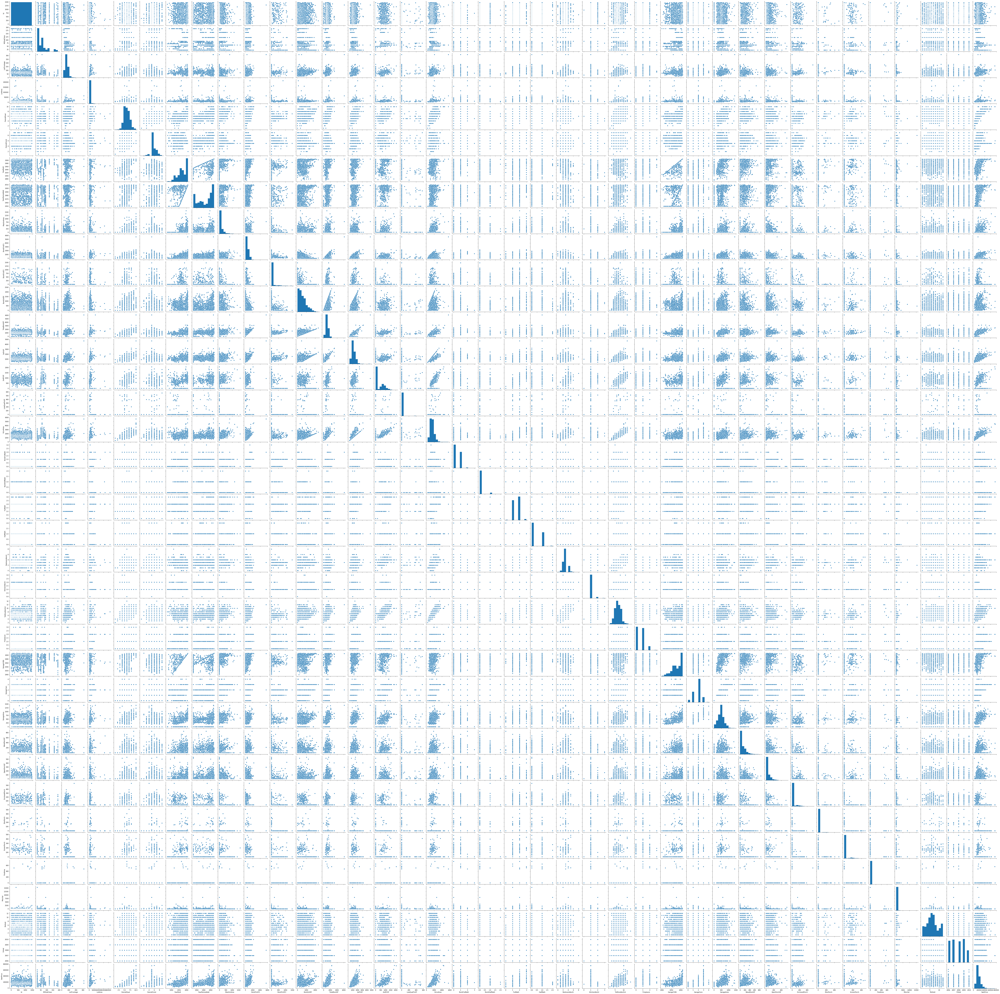

In [16]:
#scatter plot for Numerical features
features_scatter_plot(num_features)

From the pair wise scatter plot we can see the distributions of all the numerical features and who it was related with the target variable 

<Figure size 1440x720 with 0 Axes>

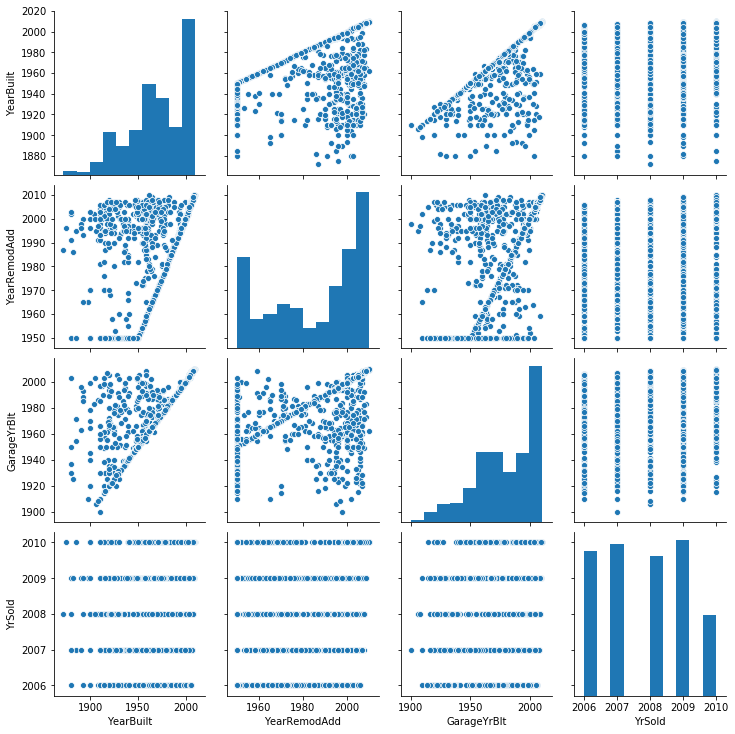

In [17]:
#scatter plot for Numerical features
features_scatter_plot(year_features)

In [18]:
#Unique values of all year features
for feature in year_features:
    print(feature, master_df[feature].unique())

YearBuilt [2003 1976 2001 1915 2000 1993 2004 1973 1931 1939 1965 2005 1962 2006
 1960 1929 1970 1967 1958 1930 2002 1968 2007 1951 1957 1927 1920 1966
 1959 1994 1954 1953 1955 1983 1975 1997 1934 1963 1981 1964 1999 1972
 1921 1945 1982 1998 1956 1948 1910 1995 1991 2009 1950 1961 1977 1985
 1979 1885 1919 1990 1969 1935 1988 1971 1952 1936 1923 1924 1984 1926
 1940 1941 1987 1986 2008 1908 1892 1916 1932 1918 1912 1947 1925 1900
 1980 1989 1992 1949 1880 1928 1978 1922 1996 2010 1946 1913 1937 1942
 1938 1974 1893 1914 1906 1890 1898 1904 1882 1875 1911 1917 1872 1905]
YearRemodAdd [2003 1976 2002 1970 2000 1995 2005 1973 1950 1965 2006 1962 2007 1960
 2001 1967 2004 2008 1997 1959 1990 1955 1983 1980 1966 1963 1987 1964
 1972 1996 1998 1989 1953 1956 1968 1981 1992 2009 1982 1961 1993 1999
 1985 1979 1977 1969 1958 1991 1971 1952 1975 2010 1984 1986 1994 1988
 1954 1957 1951 1978 1974]
GarageYrBlt [2003. 1976. 2001. 1998. 2000. 1993. 2004. 1973. 1931. 1939. 1965. 2005.
 1962. 2006.

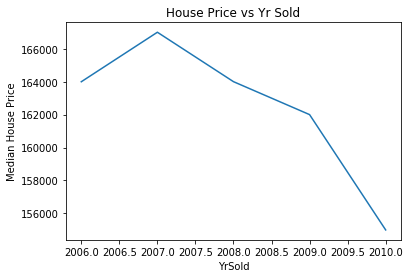

In [19]:
# House Price vs Yr Sold plot to check the trends between features
master_df.groupby('YrSold')['SalePrice'].median().plot()
plt.xlabel(feature)
plt.ylabel('Median House Price')
plt.title('House Price vs Yr Sold')
plt.show()

seems house prices were declined with increase years which seems to be some issue with the data 

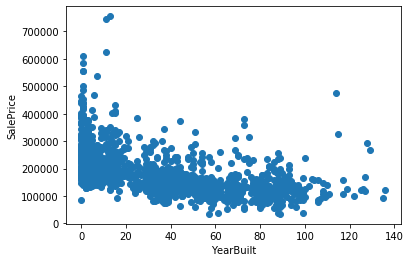

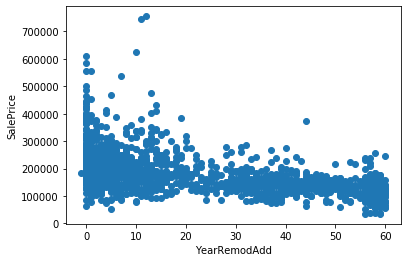

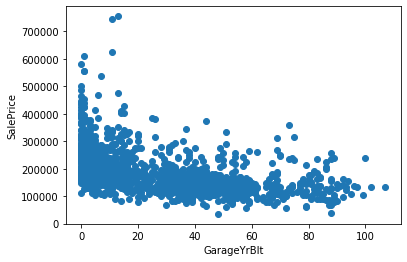

In [20]:
#Scatter plots for year features and distributions 
for feature in year_features:
    if feature!='YrSold':
        data = master_df.copy()
        
        data[feature] = data['YrSold']-data[feature]
        
        plt.scatter(data[feature], data['SalePrice'])
        plt.xlabel(feature)
        plt.ylabel('SalePrice')
        plt.show()

Fro the aabove scatter plots we can clearly see that 

### Bar plot of Features w.r.t to SalePrice

In [21]:
def bar_plot_features(feature_type):
    for feature in feature_type:
        data = master_df.copy()
        data.groupby(feature)['SalePrice'].median().plot.bar()
        plt.xlabel(feature)
        plt.ylabel('SalePrice')
        plt.title(feature)
        plt.show()

### Histogram plot of Features for distribution analysis

In [22]:
def dist_plot_features(feature_type):
    for feature in feature_type:
        data = master_df.copy()
        data[feature].hist(bins=25)
        plt.xlabel(feature)
        plt.ylabel("Count")
        plt.title(feature)
        plt.show()

### Box plot of Features for Outlier analysis

In [23]:
def box_plot_features(feature_type):
    for feature in feature_type:
        data = master_df.copy()
        if 0 in data[feature].unique():
            pass
        else:
            data[feature] = np.log(data[feature])
            data.boxplot(column=feature)
            plt.ylabel(feature)
            plt.title(feature)
            plt.show()

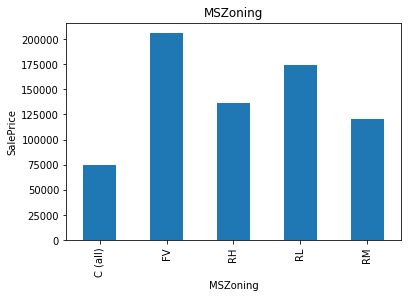

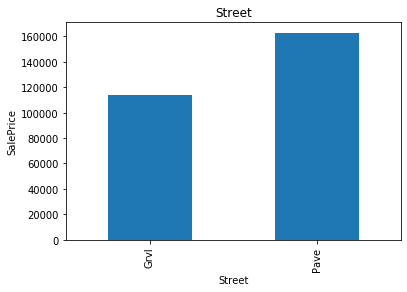

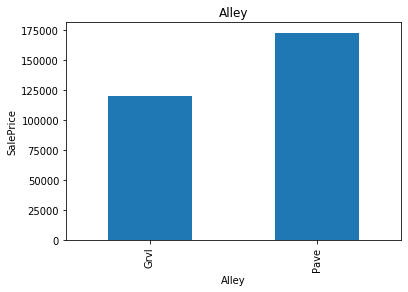

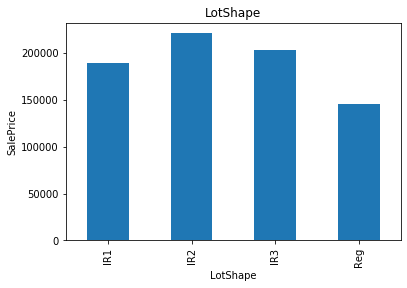

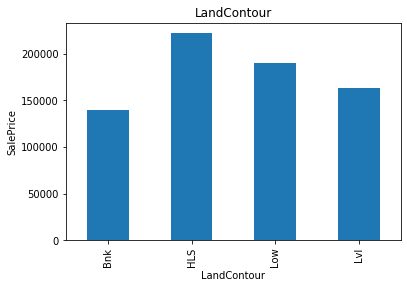

...

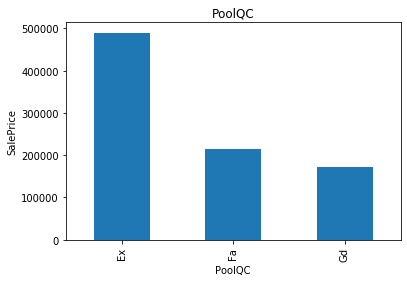

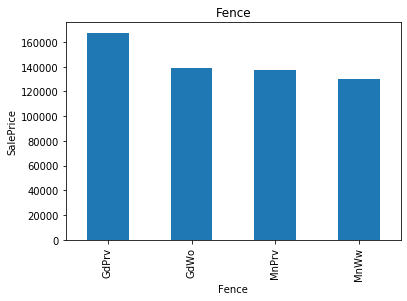

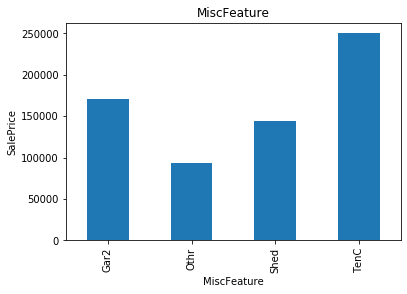

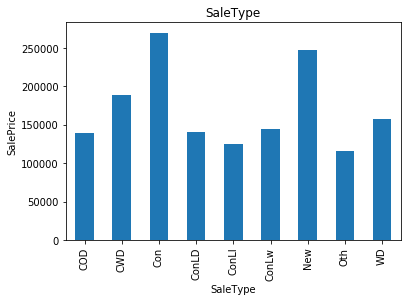

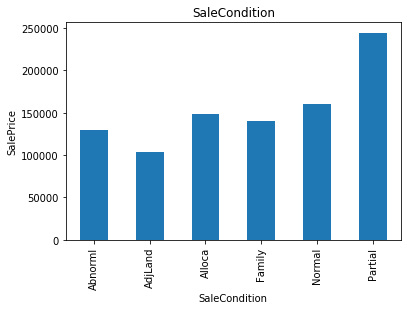

In [24]:
#Plot discrete features
bar_plot_features(categorical_features)

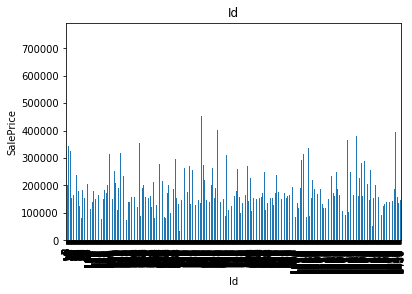

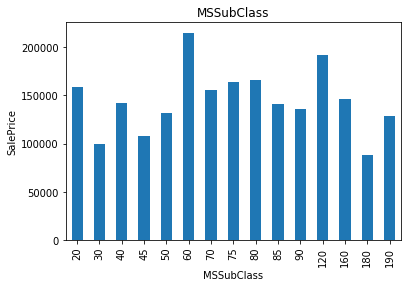

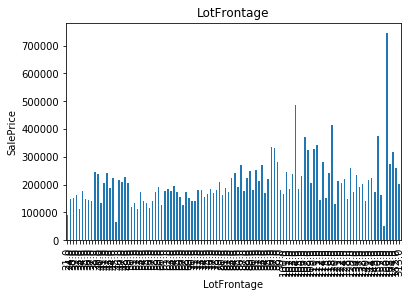

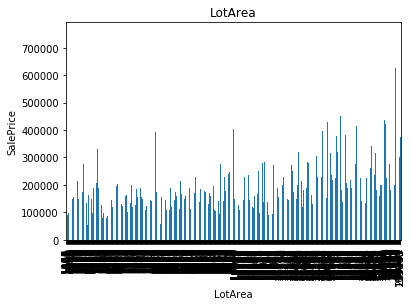

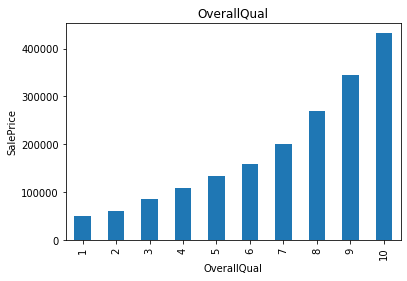

...

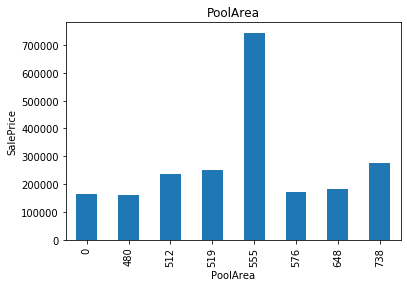

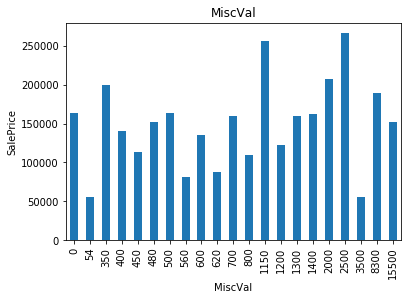

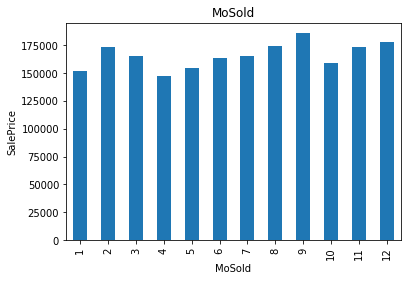

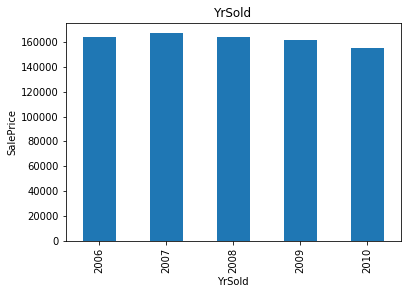

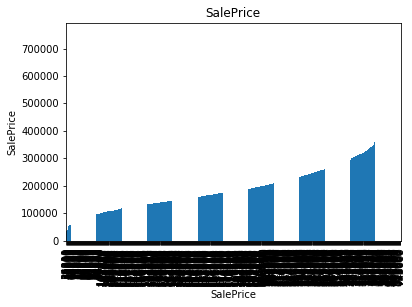

In [25]:
bar_plot_features(num_features)

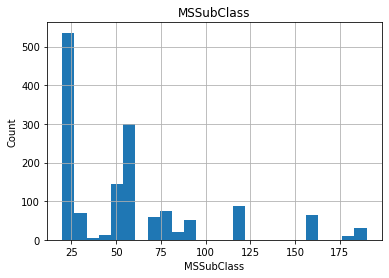

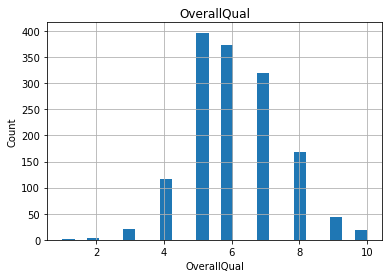

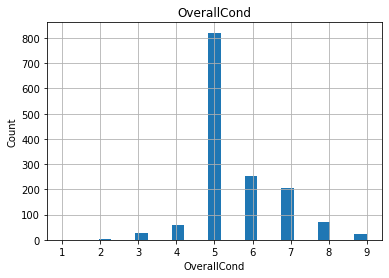

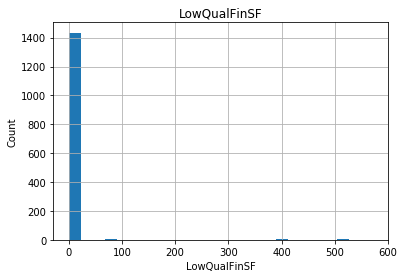

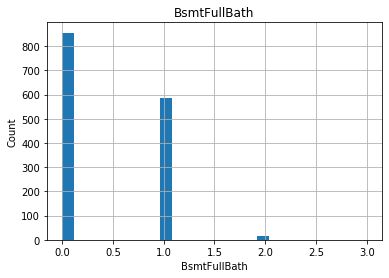

...

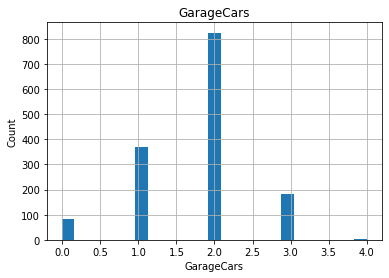

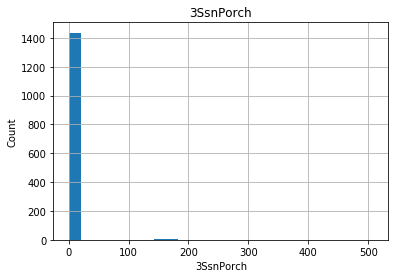

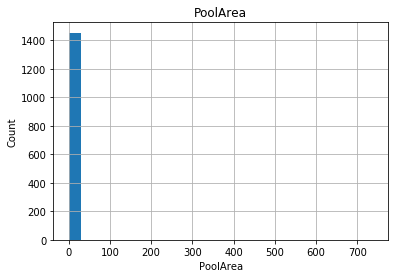

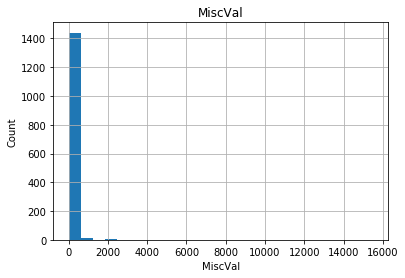

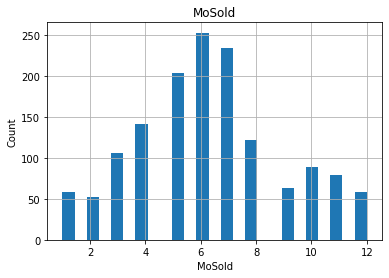

In [26]:
dist_plot_features(discrete_features)

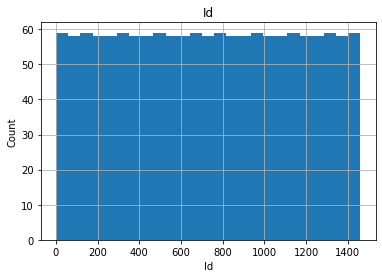

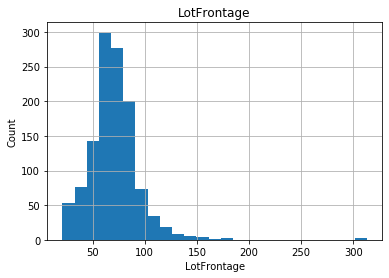

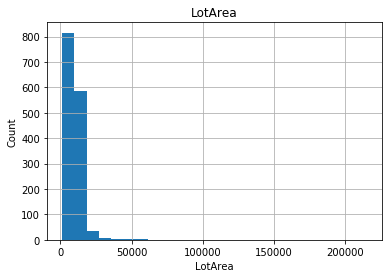

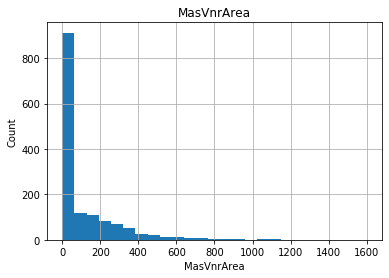

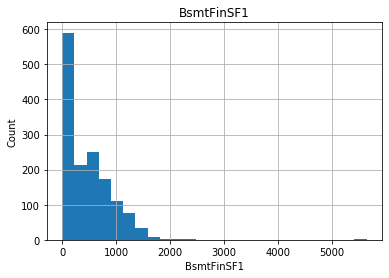

...

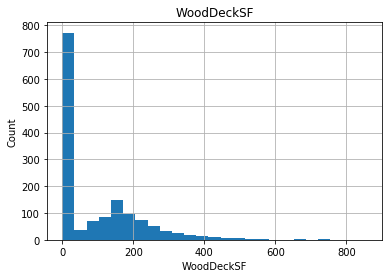

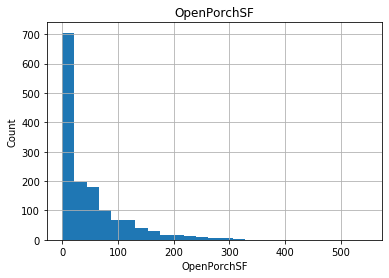

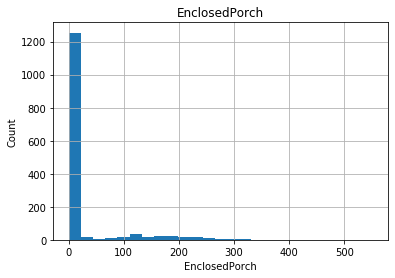

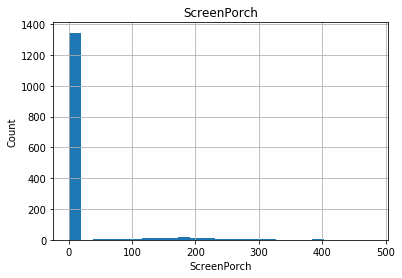

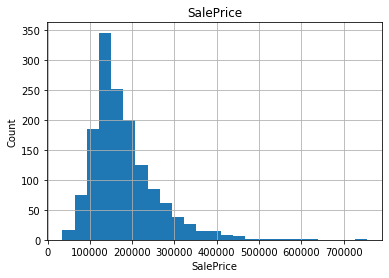

In [27]:
dist_plot_features(continuous_features)

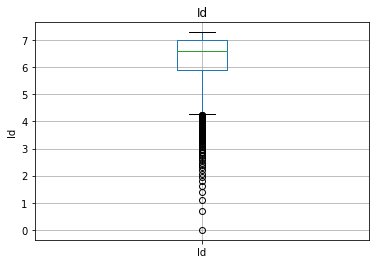

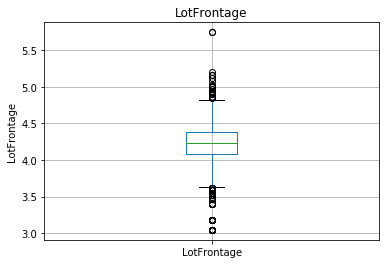

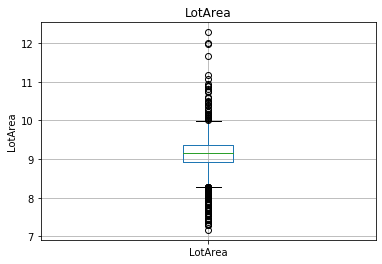

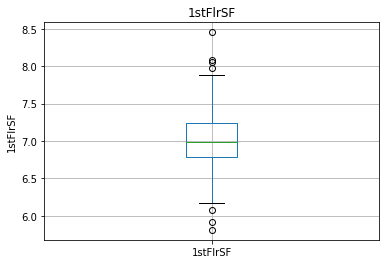

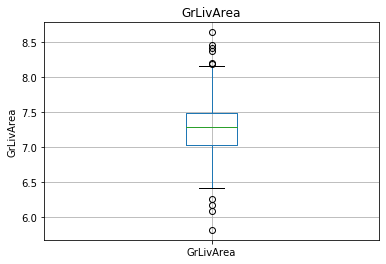

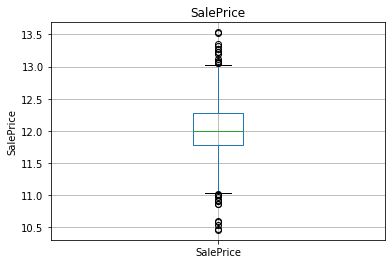

In [28]:
box_plot_features(continuous_features)

In [29]:
# correlation matrix
cor = master_df[num_features].corr()
cor

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.011156,-0.010601,-0.033226,-0.028365,0.012609,-0.012713,-0.021998,-0.050298,-0.005024,-0.005968,-0.007940,-0.015415,0.010496,0.005590,-0.044230,0.008273,0.002289,-0.020155,0.005587,0.006784,0.037719,0.002951,0.027239,-0.019772,0.000072,0.016570,0.017634,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.006242,0.021172,0.000712,-0.021917
MSSubClass,0.011156,1.000000,-0.386347,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022936,-0.069836,-0.065649,-0.140759,-0.238518,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.040380,-0.045569,0.085072,-0.040110,-0.098672,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.010601,-0.386347,1.000000,0.426095,0.251646,-0.059213,0.123349,0.088866,0.193458,0.233633,0.049900,0.132644,0.392075,0.457181,0.080177,0.038469,0.402797,0.100949,-0.007234,0.198769,0.053532,0.263170,-0.006069,0.352096,0.266639,0.070250,0.285691,0.344997,0.088521,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,0.351799
LotArea,-0.033226,-0.139781,0.426095,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104160,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,-0.024947,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,-0.028365,0.032628,0.251646,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411876,0.239666,-0.059119,0.308159,0.537808,0.476224,0.295493,-0.030429,0.593007,0.111098,-0.040150,0.550600,0.273458,0.101676,-0.183882,0.427452,0.396765,0.547766,0.600671,0.562022,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,0.012609,-0.059316,-0.059213,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128101,-0.046231,0.040229,-0.136841,-0.171098,-0.144203,0.028942,0.025494,-0.079686,-0.054942,0.117821,-0.194149,-0.060769,0.012980,-0.087001,-0.057583,-0.023820,-0.324297,-0.185758,-0.151521,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,-0.012713,0.027850,0.123349,0.014228,0.572323,-0.375983,1.000000,0.592855,0.315707,0.249503,-0.049107,0.149040,0.391452,0.281986,0.010308,-0.183784,0.199010,0.187599,-0.038162,0.468271,0.242656,-0.070651,-0.174800,0.095589,0.147716,0.825667,0.537850,0.478954,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,-0.021998,0.040581,0.088866,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.128451,-0.067759,0.181133,0.291066,0.240379,0.140024,-0.062419,0.287389,0.119470,-0.012337,0.439046,0.183331,-0.040581,-0.149598,0.191740,0.112581,0.642277,0.420622,0.371600,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,-0.050298,0.022936,0.193458,0.104160,0.411876,-0.128101,0.315707,0.179618,1.000000,0.264736,-0.072319,0.114442,0.363936,0.344501,0.174561,-0.069071,0.390857,0.085310,0.026673,0.276833,0.201444,0.102821,-0.037610,0.280682,0.249070,0.252691,0.364204,0.373066,0.159718,0.125703,-0.110204,0.018796,0.061466,0.011723,-0.029815,-0.005965,-0.008201,0.477493
BsmtFinSF1,-0.005024,-0.069836,0.233633,0.214103,0.239666,-0.046231,0.249503,0.128451,0.264736,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,-0.064503,0.208171,0.649212,0.067418,0.058543,0.004262,-0.107355,-0.081007,0.044316,0.260011,0.153484,0.224054,0.296970,0.204306,0.111761,-0.102303,0.026451

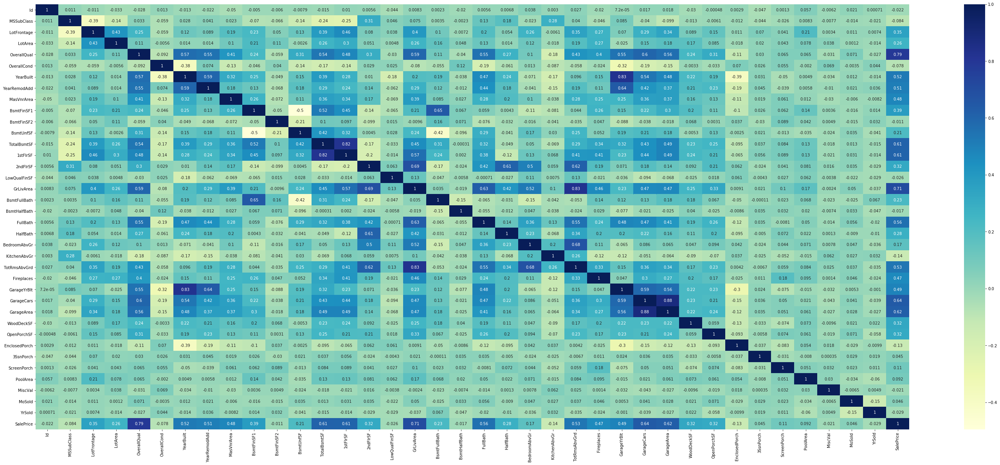

In [30]:
# plotting correlations on a heatmap

# figure size
plt.figure(figsize=(50,20))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

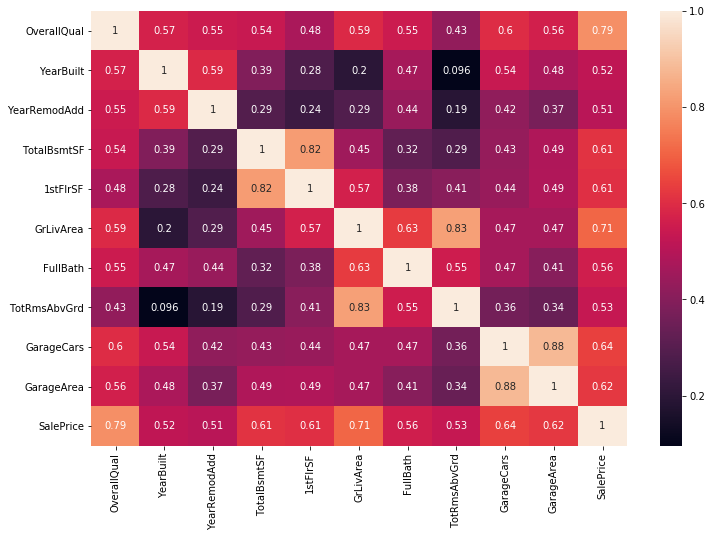

In [31]:

top_feature = cor.index[abs(cor['SalePrice']>0.5)]
plt.subplots(figsize=(12, 8))
top_corr = master_df[top_feature].corr()
sns.heatmap(top_corr, annot=True)
plt.show()

In [32]:
# feature correlation with 'SalePrice'
master_df.corr()['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePr

<b>Observation :</b>

    1. 'GrLivArea' and 'TotalBsmtSF' seem to be linearly related with 'SalePrice'. Both relationships are positive, which means that as one variable increases, the other also increases. In the case of 'TotalBsmtSF', we can see that the slope of the linear relationship is particularly high.
    2. 'OverallQual' and 'YearBuilt' also seem to be related with 'SalePrice'. The relationship seems to be stronger in the case of 'OverallQual', where the box plot shows how sales prices increase with the overall quality.
    3. From heap map we can see GarageCars adn GarageArea are strongly correlated so we can drop one of them based on SalePrice feature correlation
    4. 'TotalBsmtSF' and '1stFloor' also seem to be strongly correlated
    5. 'TotRmsAbvGrd' and 'GrLivArea', also seems to be strong correlated 
    6. YrBuild is also correlated with SalePrice
    7. MasVnrArea' and 'MasVnrType', we can consider that these variables are not essential they have a strong correlation with 'YearBuilt' and 'OverallQual'
    8. From box plot we can see outliers for 'LotFrontage','LotArea','1stFlrSF','GrLivArea','SalePrice' fields we will treat them in feature engineering 
    9. From Bar plot for categorical features we can see the trends of each feature w.r.t sales 
    10. In 

### 4. Feature Engineering

### a. Check null values and impute missing values 

In [33]:
# Finding null values in master dataframe
na_features = [features for features in master_df.columns if master_df[features].isnull().sum()>1]

na_features

['LotFrontage',
 'Alley',
 'MasVnrType',
 'MasVnrArea',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

In [34]:
# getting % values
for feautres in na_features:
    print(feautres , np.round(master_df[feautres].isnull().mean()*100,2),'%')

LotFrontage 17.74 %
Alley 93.77 %
MasVnrType 0.55 %
MasVnrArea 0.55 %
BsmtQual 2.53 %
BsmtCond 2.53 %
BsmtExposure 2.6 %
BsmtFinType1 2.53 %
BsmtFinType2 2.6 %
FireplaceQu 47.26 %
GarageType 5.55 %
GarageYrBlt 5.55 %
GarageFinish 5.55 %
GarageQual 5.55 %
GarageCond 5.55 %
PoolQC 99.52 %
Fence 80.75 %
MiscFeature 96.3 %


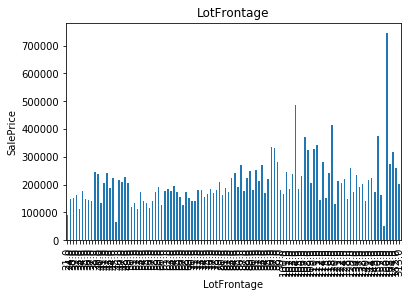

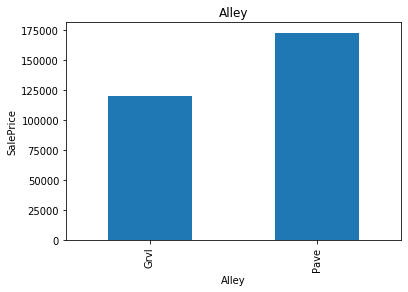

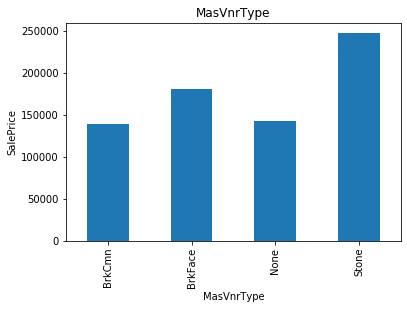

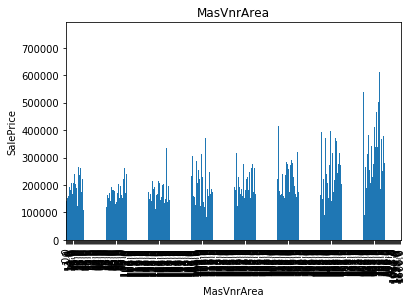

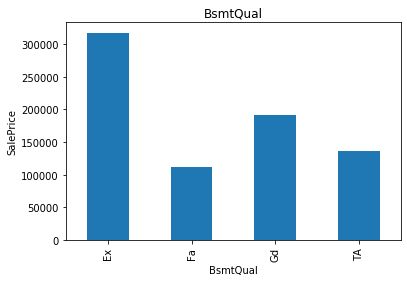

...

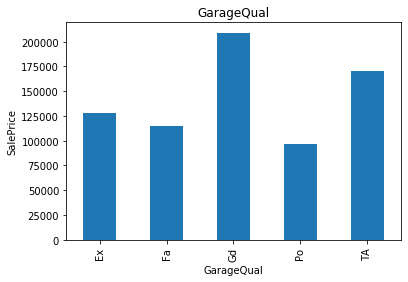

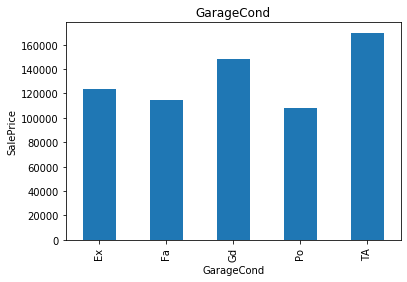

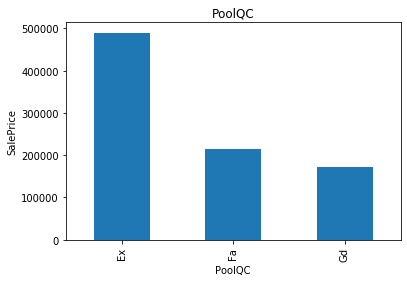

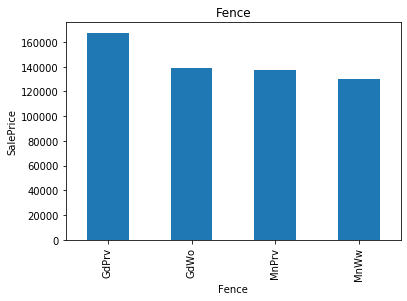

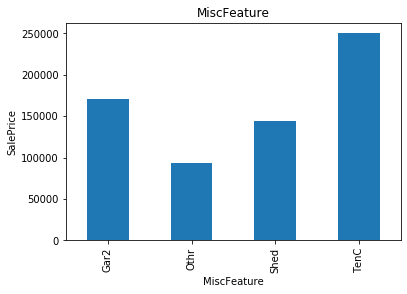

In [35]:
bar_plot_features(na_features)

In [36]:
na_categorical_features = [features for features in master_df.columns if (master_df[features].isnull().sum()>1 and master_df[features].dtype=='O')]

na_categorical_features

['Alley',
 'MasVnrType',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

In [37]:
for feature in na_categorical_features:
    print(feature,np.round(master_df[feature].isnull().mean()*100,2),'%')

Alley 93.77 %
MasVnrType 0.55 %
BsmtQual 2.53 %
BsmtCond 2.53 %
BsmtExposure 2.6 %
BsmtFinType1 2.53 %
BsmtFinType2 2.6 %
FireplaceQu 47.26 %
GarageType 5.55 %
GarageFinish 5.55 %
GarageQual 5.55 %
GarageCond 5.55 %
PoolQC 99.52 %
Fence 80.75 %
MiscFeature 96.3 %


<b>Observation:</b>
   
   Percentage of null values as percentage in different columns. If we drop them we might miss the data lets say PoolQC has 99% no data but that means the house doesnt have pool which might be helpful for price prediction
   
   So replacing null values in catogorical features as None, so that we can use it as another category for our analysis

In [38]:
#Utilty Method for replacing NaN values
def replace_cat_feature(master_df,features):
    data = master_df.copy()
    data[features] = data[features].fillna('None')
    return data

In [39]:
#Replace NaN values with new label for categorical features 
master_df = replace_cat_feature(master_df,na_categorical_features)

master_df[na_categorical_features].isnull().sum()

Alley           0
MasVnrType      0
BsmtQual        0
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinType2    0
FireplaceQu     0
GarageType      0
GarageFinish    0
GarageQual      0
GarageCond      0
PoolQC          0
Fence           0
MiscFeature     0
dtype: int64

In [40]:
master_df[na_categorical_features].head(20)

,Alley,MasVnrType,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature
0,None,BrkFace,Gd,TA,No,GLQ,Unf,None,Attchd,RFn,TA,TA,None,None,None
1,None,None,Gd,TA,Gd,ALQ,Unf,TA,Attchd,RFn,TA,TA,None,None,None
2,None,BrkFace,Gd,TA,Mn,GLQ,Unf,TA,Attchd,RFn,TA,TA,None,None,None
3,None,None,TA,Gd,No,ALQ,Unf,Gd,Detchd,Unf,TA,TA,None,None,None
4,None,BrkFace,Gd,TA,Av,GLQ,Unf,TA,Attchd,RFn,TA,TA,None,None,None
5,None,None,Gd,TA,No,GLQ,Unf,None,Attchd,Unf,TA,TA,None,MnPrv,Shed
6,None,Stone,Ex,TA,Av,GLQ,Unf,Gd,Attchd,RFn,TA,TA,None,None,None
7,None,Stone,Gd,TA,Mn,ALQ,BLQ,TA,Attchd,RFn,TA,TA,None,None,Shed
8,None,None,TA,TA,No,Unf,Unf,TA,Detchd,Unf,Fa,TA,None,None,None
9,None,None,TA,TA,No,GLQ,Unf,TA,Attchd,RFn,Gd,TA,None,None,None


In [41]:
num_na_features = [feature for feature in num_features if master_df[feature].isnull().sum()>1]

for feature in num_na_features:    
    print("{}: {}% ".format(feature,np.round(master_df[feature].isnull().mean()*100,2)))

LotFrontage: 17.74% 
MasVnrArea: 0.55% 
GarageYrBlt: 5.55% 


In [42]:
#need to replace missing values with median as we have outliner 
for feature in num_na_features:
    median_val = master_df[feature].median()
    #creating a new feature to capture nan values
    master_df[feature+'_nan'] = np.where(master_df[feature].isnull(),1,0)
    master_df[feature].fillna(median_val,inplace=True)
    
master_df[num_na_features].isnull().sum()

LotFrontage    0
MasVnrArea     0
GarageYrBlt    0
dtype: int64

In [43]:
master_df[num_na_features].head()

,LotFrontage,MasVnrArea,GarageYrBlt
0,65.0,196.0,2003.0
1,80.0,0.0,1976.0
2,68.0,162.0,2001.0
3,60.0,0.0,1998.0
4,84.0,350.0,2000.0


In [44]:
master_df.head(20)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,LotFrontage_nan,MasVnrArea_nan,GarageYrBlt_nan
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,2008,WD,Normal,208500,0,0,0
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,2007,WD,Normal,181500,0,0,0
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,2008,WD,Normal,223500,0,0,0
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,2006,WD,Abnorml,140000,0,0,0
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,2008,WD,Normal,250000,0,0,0
5,6,50,RL,85.0,14115,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,None,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,None,MnPrv,Shed,700,10,2009,WD,Normal,143000,0,0,0
6,7,20,RL,75.0,10084,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,None,None,None,0,8,2007,WD,Normal,307000,0,0,0
7,8,60,RL,69.0,10382,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,None,None,Shed,350,11,2009,WD,Normal,200000,1,0,0
8,9,50,RM,51.0,6120,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,None,None,None,0,4,2008,WD,Abnorml,129900,0,0,0
9,10,190,RL,50.0,7420,Pave,None,Reg,Lvl,AllPub,Corner,Gt

### Deriving New Features 

In [45]:
#creating age features from year features
for feature in year_features:
    if(feature!='YrSold'):
        master_df[feature+'_age'] = master_df['YrSold']-master_df[feature]

In [46]:
master_df['TotalSqFt'] = master_df['TotalBsmtSF'] + master_df['1stFlrSF'] + master_df['2ndFlrSF']

In [47]:
# Utility function for drop features
def delete_features(feature_list):
    for feature in feature_list:
        master_df.drop(feature,axis='columns',inplace=True)

In [48]:
#Drop temp columns and yr related columns
drop_columns = ['LotFrontage_nan','MasVnrArea_nan','GarageYrBlt_nan']

year_features

#temp columns
delete_features(drop_columns)

#Year related column as we calculated age 
delete_features(year_features)


In [49]:
high_correlated_features = ['TotRmsAbvGrd','GarageArea','BsmtFinSF1']

delete_features(high_correlated_features)

<b>Observation:</b>
    Dropped unwanted, highly correlated and year realted field as we have created derived columns for year features for more appropriate for analysis and model building


In [50]:
master_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,YearBuilt_age,YearRemodAdd_age,GarageYrBlt_age,TotalSqFt
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,Typ,0,None,Attchd,RFn,2,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,WD,Normal,208500,5,5,5.0,2566
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,Typ,1,TA,Attchd,RFn,2,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,WD,Normal,181500,31,31,31.0,2524
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,Typ,1,TA,Attchd,RFn,2,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,WD,Normal,223500,7,6,7.0,2706
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,Typ,1,Gd,Detchd,Unf,3,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,WD,Abnorml,140000,91,36,8.0,2473
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,Typ,1,TA,Attchd,RFn,3,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,WD,Normal,250000,8,8,8.0,3343


In [51]:
#Numerical Feature names after removing some fields 
num_features = [feature for feature in master_df.columns if master_df[feature].dtype !='O']

In [52]:
for feature in num_features:
    upperQR = np.percentile(master_df[feature],75)
    lowerQR = np.percentile(master_df[feature],25)
    IQR = upperQR - lowerQR
    
    upperVal = upperQR+(1.5*IQR)
    lowerVal = lowerQR-(1.5*IQR)
    
    minVal = min(master_df[master_df[feature]>=lowerVal][feature])
    maxVal = max(master_df[master_df[feature]<=upperVal][feature])
    
    print(feature,"\t",(len(master_df[master_df[feature]>maxVal][feature])+len(master_df[master_df[feature]<minVal][feature])))

Id 	 0
MSSubClass 	 103
LotFrontage 	 106
LotArea 	 69
OverallQual 	 2
OverallCond 	 125
MasVnrArea 	 98
BsmtFinSF2 	 167
BsmtUnfSF 	 29
TotalBsmtSF 	 61
1stFlrSF 	 20
2ndFlrSF 	 2
LowQualFinSF 	 26
GrLivArea 	 31
BsmtFullBath 	 1
BsmtHalfBath 	 82
FullBath 	 0
HalfBath 	 0
BedroomAbvGr 	 35
KitchenAbvGr 	 68
Fireplaces 	 5
GarageCars 	 5
WoodDeckSF 	 32
OpenPorchSF 	 77
EnclosedPorch 	 208
3SsnPorch 	 24
ScreenPorch 	 116
PoolArea 	 7
MiscVal 	 52
MoSold 	 0
SalePrice 	 61
YearBuilt_age 	 8
YearRemodAdd_age 	 0
GarageYrBlt_age 	 1
TotalSqFt 	 25


MSSubClass, LotFrontage, LotArea, BsmtFinSF1, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, GrLivArea, SalePrice

Treating the outliers using log transforamtion in below steps 

In [53]:
#make sure 0 value doenst exists in num features from the box plot
num_skewed_features = ['LotFrontage','LotArea','1stFlrSF','GrLivArea','SalePrice']

for feature in num_skewed_features:
    master_df[feature] = np.log(master_df[feature])

### SalePrice Distribution and analysis after log transformation

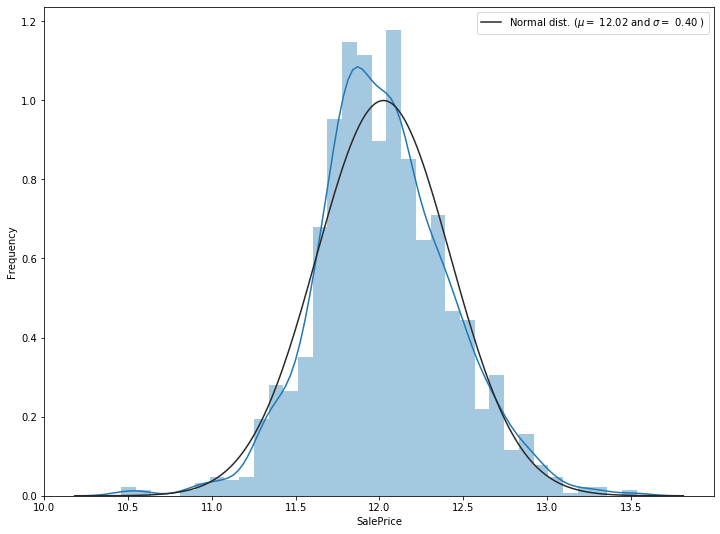

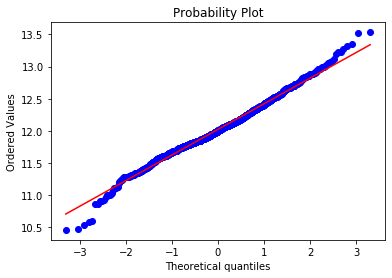

In [54]:
plt.subplots(figsize=(12,9))
sns.distplot(master_df['SalePrice'], fit=stats.norm)

# Get the fitted parameters used by the function

(mu, sigma) = stats.norm.fit(master_df['SalePrice'])

# plot with the distribution

plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
plt.ylabel('Frequency')

#Probablity plot

fig = plt.figure()
stats.probplot(master_df['SalePrice'], plot=plt)
plt.show()

In [55]:
for feature in categorical_features:
    print('Feature id {} and number of categories are {}'.format(feature,len(master_df[feature].unique())))

Feature id MSZoning and number of categories are 5
Feature id Street and number of categories are 2
Feature id Alley and number of categories are 3
Feature id LotShape and number of categories are 4
Feature id LandContour and number of categories are 4
Feature id Utilities and number of categories are 2
Feature id LotConfig and number of categories are 5
Feature id LandSlope and number of categories are 3
Feature id Neighborhood and number of categories are 25
Feature id Condition1 and number of categories are 9
Feature id Condition2 and number of categories are 8
Feature id BldgType and number of categories are 5
Feature id HouseStyle and number of categories are 8
Feature id RoofStyle and number of categories are 6
Feature id RoofMatl and number of categories are 8
Feature id Exterior1st and number of categories are 15
Feature id Exterior2nd and number of categories are 16
Feature id MasVnrType and number of categories are 4
Feature id ExterQual and number of categories are 4
Feature

<b>Observation:</b>
    We can see for 43 categorical feature with different categories, if we go with dummies creation will add up 200+ features which makes our model more complex. For this we are going with Label Encoding. Which wont add up any new features and can go with scaling 

In [56]:
for feature in categorical_features:
    temp=master_df.groupby(feature)['SalePrice'].count()/len(master_df)
    temp_df=temp[temp>0.01].index
    master_df[feature]=np.where(master_df[feature].isin(temp_df),master_df[feature],'Rare_Category')
    

In [57]:
master_df.head(50)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,YearBuilt_age,YearRemodAdd_age,GarageYrBlt_age,TotalSqFt
0,1,60,RL,4.174387,9.041922,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,0,150,856,GasA,Ex,Y,SBrkr,6.752270,854,0,7.444249,1,0,2,1,3,1,Gd,Typ,0,None,Attchd,RFn,2,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,WD,Normal,12.247694,5,5,5.0,2566
1,2,20,RL,4.382027,9.169518,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Rare_Category,Feedr,Norm,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,0,284,1262,GasA,Ex,Y,SBrkr,7.140453,0,0,7.140453,0,1,2,0,3,1,TA,Typ,1,TA,Attchd,RFn,2,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,WD,Normal,12.109011,31,31,31.0,2524
2,3,60,RL,4.219508,9.328123,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,0,434,920,GasA,Ex,Y,SBrkr,6.824374,866,0,7.487734,1,0,2,1,3,1,Gd,Typ,1,TA,Attchd,RFn,2,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,WD,Normal,12.317167,7,6,7.0,2706
3,4,70,RL,4.094345,9.164296,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,0,540,756,GasA,Gd,Y,SBrkr,6.867974,756,0,7.448334,1,0,1,0,3,1,Gd,Typ,1,Gd,Detchd,Unf,3,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,WD,Abnorml,11.849398,91,36,8.0,2473
4,5,60,RL,4.430817,9.565214,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,0,490,1145,GasA,Ex,Y,SBrkr,7.043160,1053,0,7.695303,1,0,2,1,4,1,Gd,Typ,1,TA,Attchd,RFn,3,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,WD,Normal,12.429216,8,8,8.0,3343
5,6,50,RL,4.442651,9.554993,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Rare_Category,Gd,TA,No,GLQ,Unf,0,64,796,GasA,Ex,Y,SBrkr,6.679599,566,0,7.216709,1,0,1,1,1,1,TA,Typ,0,None,Attchd,Unf,2,TA,TA,Y,40,30,0,320,0,0,None,MnPrv,Shed,700,10,WD,Normal,11.870600,16,14,16.0,2158
6,7,20,RL,4.317488,9.218705,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,0,317,1686,GasA,Ex,Y,SBrkr,7.434848,0,0,7.434848,1,0,2,0,3,1,Gd,Typ,1,Gd,Attchd,RFn,2,TA,TA,Y,255,57,0,0,0,0,None,None,None,0,8,WD,Normal,12.634603,3,2,3.0,3380
7,8,60,RL,4.234107,9.247829,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,7.009409,983,0,7.644919,1,0,2,1,3,1,TA,Typ,2,TA,Attchd,RFn,2,TA,TA,Y,235,204,228,0,0,0,None,None,Shed,350,11,WD,Normal,12.206073,36,36,36.0,3197
8,9,50,RM,3.931826,8.719317,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,Unf,0,952,952,GasA,Gd,Y,FuseF,6.929517,752,0,7.480992,0,0,2,0,2,2,TA,Min1,2,TA,Detchd,Unf,2,Fa,TA,Y,90,0,205,0,0,0,None,None,None,0,4,WD,Abnorml,11.774520,77,58,77.0,2726
9,10,190,RL,3.912023,8.911934,Pave,None,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Rare_Category,2fmCon,Rare_Category,5,6,Gable,CompShg,MetalSd,MetalS

In [58]:
for feature in categorical_features:
    labels_ordered=master_df.groupby([feature])['SalePrice'].mean().sort_values().index
    labels_ordered={k:i for i,k in enumerate(labels_ordered,0)}
    master_df[feature]=master_df[feature].map(labels_ordered)

In [59]:
master_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,YearBuilt_age,YearRemodAdd_age,GarageYrBlt_age,TotalSqFt
0,1,60,3,4.174387,9.041922,1,2,0,1,1,0,0,14,2,1,3,5,7,5,0,0,10,10,2,196.0,2,3,4,3,3,1,6,5,0,150,856,2,4,1,3,6.752270,854,0,7.444249,1,0,2,1,3,1,2,4,0,1,4,2,2,2,3,2,0,61,0,0,0,0,0,4,2,0,2,2,3,12.247694,5,5,5.0,2566
1,2,20,3,4.382027,9.169518,1,2,0,1,1,2,0,11,1,1,3,3,6,8,0,0,4,3,1,0.0,1,3,2,3,3,4,4,5,0,284,1262,2,4,1,3,7.140453,0,0,7.140453,0,1,2,0,3,1,1,4,1,3,4,2,2,2,3,2,298,0,0,0,0,0,0,4,2,0,5,2,3,12.109011,31,31,31.0,2524
2,3,60,3,4.219508,9.328123,1,2,1,1,1,0,0,14,2,1,3,5,7,5,0,0,10,10,2,162.0,2,3,4,3,3,2,6,5,0,434,920,2,4,1,3,6.824374,866,0,7.487734,1,0,2,1,3,1,2,4,1,3,4,2,2,2,3,2,0,42,0,0,0,0,0,4,2,0,9,2,3,12.317167,7,6,7.0,2706
3,4,70,3,4.094345,9.164296,1,2,1,1,1,1,0,16,2,1,3,5,7,5,0,0,2,4,1,0.0,1,3,1,2,4,1,4,5,0,540,756,2,3,1,3,6.867974,756,0,7.448334,1,0,1,0,3,1,2,4,1,4,2,1,3,2,3,2,0,35,272,0,0,0,0,4,2,0,2,2,0,11.849398,91,36,8.0,2473
4,5,60,3,4.430817,9.565214,1,2,1,1,1,2,0,22,2,1,3,5,8,5,0,0,10,10,2,350.0,2,3,4,3,3,3,6,5,0,490,1145,2,4,1,3,7.043160,1053,0,7.695303,1,0,2,1,4,1,2,4,1,3,4,2,3,2,3,2,192,84,0,0,0,0,0,4,2,0,12,2,3,12.429216,8,8,8.0,3343


In [60]:
drop_columns = ['Id']

delete_features(drop_columns)



<b>Note:</b> Dropped Id column as it is not just for index and doesnt have any significance

### Model creation and evaluation 

In [61]:
## Always remember there way always be a chance of data leakage so we need to split the data first and then apply feature
## Engineering
np.random.seed(0)
df_train, df_test = train_test_split(master_df, train_size=0.7, test_size=0.3, random_state=100)

In [62]:
#Numerical Feature names after converting all categorical features by label encoding
num_features = [feature for feature in df_train.columns if df_train[feature].dtype !='O']
print("Length of the Numerical features: ",len(num_features))
num_features

Length of the Numerical features:  77


['MSSubClass',
 'MSZoning',
 'LotFrontage',
 'LotArea',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageCars',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'PoolQC',
 'Fence',
 'MiscFeature',
 

In [63]:
df_train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,YearBuilt_age,YearRemodAdd_age,GarageYrBlt_age,TotalSqFt
210,30,3,4.204693,8.631236,1,2,0,1,1,0,0,5,2,1,3,3,5,6,0,0,5,2,1,0.0,1,3,2,2,3,1,1,5,0,396,864,2,2,0,2,6.761573,0,0,6.761573,1,0,1,0,2,1,1,4,0,1,0,0,0,0,0,2,0,0,96,0,0,0,0,4,2,0,4,2,3,11.492723,83,58,28.0,1728
318,60,3,4.499810,9.200290,1,2,0,2,1,0,1,22,2,1,3,5,7,5,0,0,6,5,2,256.0,2,3,4,3,3,4,6,5,0,360,1347,2,4,1,3,7.224025,1274,0,7.880804,1,0,2,1,4,1,2,4,1,3,4,2,3,2,3,2,340,60,144,0,0,0,0,4,2,0,4,2,3,12.468437,16,16,16.0,3993
239,50,3,3.951244,9.075780,1,2,0,1,1,0,0,5,2,1,3,1,6,4,0,0,10,10,1,0.0,1,3,2,2,2,1,3,5,0,641,735,2,2,1,2,6.682109,689,0,7.304516,0,0,1,1,3,1,1,4,1,4,2,1,1,2,3,2,0,140,0,0,0,0,0,2,2,0,4,2,3,11.635143,65,60,61.0,2222
986,50,1,4.077537,8.577347,1,2,0,1,1,1,0,4,1,1,3,1,6,8,2,0,10,10,1,0.0,1,2,2,2,2,1,5,5,0,485,485,2,3,1,3,6.908755,634,0,7.399398,0,0,1,0,2,1,2,4,0,1,4,1,1,1,3,2,394,0,0,0,0,0,0,4,2,0,6,2,3,11.669929,96,3,56.0,2120
1416,190,1,4.094345,9.336092,1,2,0,1,1,0,0,4,2,1,0,5,4,6,0,0,10,0,1,0.0,1,3,4,2,3,1,5,5,0,777,777,2,3,1,3,7.127694,1044,0,7.736307,0,0,2,0,4,2,1,4,0,1,2,1,2,2,3,0,0,0,114,0,0,0,0,4,2,0,4,2,3,11.715866,125,60,39.0,3067


In [64]:
# Split the train dataset into X and y

y_train = df_train.pop('SalePrice')
y_test = df_test.pop('SalePrice')

In [65]:
scaling_feature=[feature for feature in num_features if feature not in ['Id','SalePrice'] ]
len(scaling_feature)

76

In [66]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_train[scaling_feature] = scaler.fit_transform(df_train[scaling_feature])

In [67]:
X_train = df_train

In [68]:
df_test[scaling_feature] = scaler.transform(df_test[scaling_feature])

In [69]:
X_test = df_test

In [70]:
df_train

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,YearBuilt_age,YearRemodAdd_age,GarageYrBlt_age,TotalSqFt
210,0.058824,0.75,0.429425,0.267670,1.0,1.0,0.000000,0.333333,1.0,0.00,0.0,0.227273,0.4,1.0,0.75,0.6,0.444444,0.625,0.0,0.0,0.5,0.2,0.333333,0.00000,0.333333,1.000000,0.50,0.50,0.75,0.25,0.166667,0.833333,0.0,0.169521,0.141408,1.0,0.50,0.0,0.666667,0.332454,0.000000,0.000000,0.265811,0.333333,0.0,0.333333,0.0,0.250,0.0,0.333333,1.0,0.000000,0.2,0.0,0.000000,0.00,0.000000,0.0,1.0,0.000000,0.000000,0.173913,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.272727,0.666667,0.75,0.610294,0.967213,0.261682,0.091371
318,0.235294,0.75,0.538660,0.381897,1.0,1.0,0.000000,0.666667,1.0,0.00,0.5,1.000000,0.4,1.0,0.75,1.0,0.666667,0.500,0.0,0.0,0.6,0.5,0.666667,0.16000,0.666667,1.000000,1.00,0.75,0.75,1.00,1.000000,0.833333,0.0,0.154110,0.220458,1.0,1.00,1.0,1.000000,0.514901,0.616949,0.000000,0.703734,0.333333,0.0,0.666667,0.5,0.500,0.0,0.666667,1.0,0.333333,0.6,0.8,0.666667,0.75,0.666667,1.0,1.0,0.396733,0.114723,0.260870,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.272727,0.666667,0.75,0.117647,0.278689,0.149533,0.296682
239,0.176471,0.75,0.335614,0.356904,1.0,1.0,0.000000,0.333333,1.0,0.00,0.0,0.227273,0.4,1.0,0.75,0.2,0.555556,0.375,0.0,0.0,1.0,1.0,0.333333,0.00000,0.333333,1.000000,0.50,0.50,0.50,0.25,0.500000,0.833333,0.0,0.274401,0.120295,1.0,0.50,1.0,0.666667,0.301104,0.333656,0.000000,0.478249,0.000000,0.0,0.333333,0.5,0.375,0.0,0.333333,1.0,0.333333,0.8,0.4,0.333333,0.25,0.666667,1.0,1.0,0.000000,0.267686,0.000000,0.0,0.0,0.0,0.0,0.5,1.0,0.0,0.272727,0.666667,0.75,0.477941,1.000000,0.570093,0.136149
986,0.176471,0.25,0.382360,0.256853,1.0,1.0,0.000000,0.333333,1.0,0.25,0.0,0.181818,0.2,1.0,0.75,0.2,0.555556,0.875,1.0,0.0,1.0,1.0,0.333333,0.00000,0.333333,0.666667,0.50,0.50,0.50,0.25,0.833333,0.833333,0.0,0.207620,0.079378,1.0,0.75,1.0,1.000000,0.390521,0.307022,0.000000,0.515374,0.000000,0.0,0.333333,0.0,0.250,0.0,0.666667,1.0,0.000000,0.2,0.8,0.333333,0.25,0.333333,1.0,1.0,0.459743,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.454545,0.666667,0.75,0.705882,0.065574,0.523364,0.126904
1416,1.000000,0.25,0.388581,0.409157,1.0,1.0,0.000000,0.333333,1.0,0.00,0.0,0.181818,0.4,1.0,0.00,1.0,0.333333,0.625,0.0,0.0,1.0,0.0,0.333333,0.00000,0.333333,1.000000,1.00,0.50,0.75,0.25,0.833333,0.833333,0.0,0.332620,0.127169,1.0,0.75,1.0,1.000000,0.476897,0.505569,0.000000,0.647196,0.000000,0.0,0.666667,0.0,0.500,0.5,0.333333,1.0,0.000000,0.2,0.4,0.333333,0.50,0.666667,1.0,0.0,0.000000,0.000000,0.206522,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.272727,0.666667,0.75,0.919118,1.000000,0.364486,0.212745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1009,0.176471,0.75,0.388581,0.281376,1.0,1.0,0.000000,0.333333,1.0,0.00,0.0,0.318182,0.4,1.0,0.75,0.2,0.444444,0.500,0.0,0.0,0.2,0.1,0.333333,0.00000,0.333333,0.000000,0.25,0.50,0.75,0.25,0.833333,0.833333,0.0,0.431507,0.164975,1.0,1.00,1.0,1.000000,0.393270,0.000000,0.998058,0.487352,0.000000,0.0,0.666667,0.0,0.500,0.0,0.333333,1.0,0.000000,0.2,0.0,0.000000,0.00,0.000000,0.0,0.5,0.000

In [71]:
df_test

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,YearBuilt_age,YearRemodAdd_age,GarageYrBlt_age,TotalSqFt
1436,0.000000,0.75,0.388581,0.362765,1.0,1.0,0.000000,0.333333,1.0,0.50,0.0,0.363636,0.4,1.0,0.75,0.6,0.333333,0.625,0.0,0.0,0.6,0.5,0.333333,0.00000,0.333333,1.000000,1.00,0.50,0.75,0.25,0.666667,0.833333,0.000000,0.106164,0.141408,1.0,0.50,1.0,1.000000,0.332454,0.000000,0.0,0.265811,0.000000,0.0,0.333333,0.0,0.375,0.0,0.333333,1.0,0.000000,0.2,0.4,0.333333,0.50,0.666667,1.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.00,1.0,0.0,0.363636,0.666667,0.75,0.264706,0.606557,0.308411,0.091371
57,0.235294,0.75,0.534524,0.414484,1.0,1.0,0.333333,0.333333,1.0,0.25,0.0,0.636364,0.4,1.0,0.75,1.0,0.666667,0.500,0.0,0.0,1.0,1.0,0.333333,0.00000,0.666667,1.000000,1.00,0.75,0.75,0.25,0.833333,0.833333,0.000000,0.368151,0.140753,1.0,1.00,1.0,1.000000,0.330624,0.416465,0.0,0.535204,0.000000,0.0,0.666667,0.5,0.375,0.0,0.666667,1.0,0.000000,0.2,0.8,0.666667,0.50,0.666667,1.0,1.0,0.000000,0.133843,0.000000,0.0,0.0,0.000000,0.0,1.00,1.0,0.0,0.636364,0.666667,0.75,0.014706,0.049180,0.018692,0.168600
780,0.000000,0.75,0.406640,0.335961,1.0,1.0,0.000000,0.333333,1.0,0.00,0.0,0.590909,0.4,1.0,0.75,0.6,0.666667,0.500,0.0,0.0,0.6,0.5,0.666667,0.02375,0.333333,1.000000,1.00,0.75,1.00,0.25,0.833333,0.833333,0.000000,0.529538,0.202455,1.0,0.75,1.0,1.000000,0.479107,0.000000,0.0,0.411256,0.000000,0.0,0.666667,0.0,0.375,0.0,0.333333,1.0,0.333333,0.6,0.8,1.000000,0.50,0.666667,1.0,1.0,0.256709,0.040153,0.000000,0.0,0.0,0.000000,0.0,1.00,1.0,0.0,0.454545,0.666667,0.75,0.088235,0.196721,0.112150,0.160442
382,0.235294,0.75,0.490408,0.368157,1.0,1.0,0.333333,0.333333,1.0,0.00,0.0,0.636364,0.4,1.0,0.75,1.0,0.666667,0.500,0.0,0.0,1.0,1.0,0.333333,0.00000,0.666667,1.000000,1.00,0.75,0.75,0.75,0.833333,0.833333,0.000000,0.401969,0.153682,1.0,1.00,1.0,1.000000,0.365295,0.415496,0.0,0.552339,0.000000,0.0,0.666667,0.5,0.375,0.0,0.666667,1.0,0.000000,0.2,0.8,0.666667,0.50,0.666667,1.0,1.0,0.168028,0.101338,0.000000,0.0,0.0,0.000000,0.0,1.00,1.0,0.0,0.272727,0.666667,0.75,0.007353,0.032787,0.009346,0.182741
1170,0.352941,0.75,0.476078,0.381491,1.0,1.0,0.000000,0.333333,1.0,0.00,0.0,0.409091,0.4,1.0,0.75,0.8,0.555556,0.625,0.0,0.0,0.7,0.7,0.333333,0.00000,0.333333,1.000000,0.50,0.50,0.75,0.75,0.666667,0.833333,0.000000,0.245719,0.179378,1.0,0.50,1.0,1.000000,0.434132,0.000000,0.0,0.366651,0.333333,0.0,0.333333,0.0,0.375,0.0,0.333333,1.0,0.333333,0.0,0.8,1.000000,0.25,0.666667,1.0,1.0,0.236873,0.000000,0.000000,0.0,0.0,0.888889,1.0,0.75,1.0,0.0,0.545455,0.666667,0.75,0.227941,0.524590,0.289720,0.135424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
509,0.000000,0.75,0.495064,0.375720,1.0,1.0,0.000000,0.333333,1.0,0.25,0.0,0.363636,0.4,1.0,0.75,0.6,0.444444,0.625,0.0,0.0,0.4,0.3,0.666667,0.08250,0.333333,1.000000,0.50,0.50,0.75,0.25,0.666667,0.833333,0.000000,0.021404,0.170376,1.0,1.00,1.0,1.000000,0.405979,0.000000,0.0,0.338730,0.333333,0.0,0.333333,0.0,0.375,0.0,0.333333,1.0,0.000000,0.2,0.8,0.66666

In [72]:
from sklearn.linear_model import Ridge, RidgeCV, ElasticNet, LassoCV, LassoLarsCV
from sklearn.model_selection import cross_val_score


### Ridge Regression

In [73]:
# list of alphas to tune
params = {'alpha': [0.0001,0.001,0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 200, 500, 1000 ]}

In [74]:
ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 29 candidates, totalling 145 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 145 out of 145 | elapsed:    2.3s finished


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 200, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [75]:
print(model_cv.best_params_)
print(abs(model_cv.best_score_))




{'alpha': 3.0}
0.8828199838178319


In [76]:

cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=200]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.006796,0.003247,0.003398,0.001019,0.0001,{'alpha': 0.0001},0.649943,0.831453,0.852281,0.915828,0.907754,0.831452,0.096250,25,0.928604,0.929089,0.931518,0.920100,0.919929,0.925848,0.004865
1,0.007795,0.000399,0.004797,0.000400,0.001,{'alpha': 0.001},0.759156,0.830561,0.852683,0.915828,0.907914,0.853228,0.057049,23,0.928013,0.929084,0.931500,0.920086,0.919916,0.925720,0.004804
2,0.006995,0.001095,0.003998,0.000632,0.01,{'alpha': 0.01},0.895178,0.824322,0.853853,0.915407,0.909005,0.879553,0.034952,13,0.922924,0.928842,0.930734,0.919431,0.919214,0.924229,0.004764
3,0.021986,0.025289,0.008794,0.007674,0.05,{'alpha': 0.05},0.901119,0.816066,0.852703,0.913664,0.910985,0.878907,0.038383,16,0.918951,0.928005,0.928136,0.916873,0.916165,0.921626,0.005341
4,0.009194,0.000748,0.005796,0.001166,0.1,{'alpha': 0.1},0.899577,0.814397,0.852118,0.913037,0.912194,0.878264,0.038929,19,0.917775,0.927594,0.926914,0.915561,0.914506,0.920470,0.005643


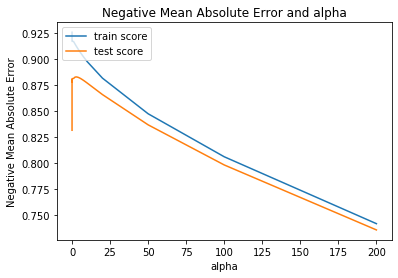

In [77]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()


In [78]:
alpha = 3
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
ridge.coef_

array([-0.04466033,  0.07270516,  0.03324373,  0.17914899,  0.07353312,
        0.02101494, -0.00873538,  0.04603028,  0.06569541,  0.01754297,
        0.01406237,  0.24823951,  0.04922221,  0.07433332, -0.00126172,
       -0.03633445,  0.37317297,  0.25860602,  0.01749869, -0.02766706,
        0.05222078, -0.0096737 , -0.00076534,  0.05427308,  0.0403208 ,
        0.01617389,  0.02856264,  0.06633495,  0.01269151,  0.07260447,
        0.00288092,  0.03996215,  0.03315921, -0.0599566 ,  0.07991273,
       -0.00228743,  0.02538632,  0.05036753,  0.01041326,  0.39588314,
        0.15246112,  0.03214587,  0.44084604,  0.14783832,  0.02359635,
        0.09971818,  0.05321774,  0.07392611, -0.05921286,  0.09978777,
        0.09489109,  0.03881887,  0.07362766, -0.00907369,  0.03095671,
        0.15261637,  0.05283591, -0.01389076,  0.02197072,  0.07031689,
        0.00716592,  0.04272418,  0.04880857,  0.06265274, -0.04785747,
       -0.1122244 ,  0.01783023,  0.02295442,  0.03332449, -0.00

In [79]:
from sklearn.metrics import r2_score

In [80]:

y_train_pred = ridge.predict(X_train)
print(r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = ridge.predict(X_test)
print(r2_score(y_true=y_test, y_pred=y_test_pred))

0.9102596390715337
0.8939448574601825


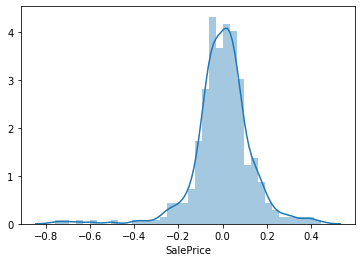

In [81]:

import seaborn as sns

sns.distplot(y_test-y_test_pred)

In [82]:
model_params_ridge = list(ridge.coef_)
model_params_ridge.insert(0,ridge.intercept_)
model_params_ridge = [round(x,3) for x in model_params_ridge]
cols = X_train.columns
cols = cols.insert(0,"constant")
ridge_list = list(zip(cols,model_params_ridge))
sorted(ridge_list, key=lambda x: abs(x[1]),reverse=True)[:15]

[('constant', 9.985),
 ('GrLivArea', 0.441),
 ('1stFlrSF', 0.396),
 ('OverallQual', 0.373),
 ('OverallCond', 0.259),
 ('Neighborhood', 0.248),
 ('LotArea', 0.179),
 ('GarageCars', 0.153),
 ('2ndFlrSF', 0.152),
 ('BsmtFullBath', 0.148),
 ('TotalSqFt', 0.122),
 ('PoolQC', -0.112),
 ('FullBath', 0.1),
 ('KitchenQual', 0.1),
 ('Functional', 0.095)]

In [97]:
# Both has almost same R2 score

coef = pd.Series(ridge.coef_, index = X_train.columns)
var_selected = sum(coef != 0)
print('Ridge has selected {} variables'.format(var_selected))

Ridge has selected 76 variables


In [98]:
main_coef = pd.concat([coef.sort_values().head(10), coef.sort_values().tail(10)])
main_coef = main_coef.sort_values(ascending=False).head(10)
main_coef

GrLivArea       0.440846
1stFlrSF        0.395883
OverallQual     0.373173
OverallCond     0.258606
Neighborhood    0.248240
LotArea         0.179149
GarageCars      0.152616
2ndFlrSF        0.152461
BsmtFullBath    0.147838
TotalSqFt       0.121719
dtype: float64

In [83]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
print(mean_squared_error(y_test, y_test_pred))
print(mean_absolute_error(y_test, y_test_pred))

0.01745032551189629
0.08920714694730007


### Lasso

In [84]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 29 candidates, totalling 145 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 145 out of 145 | elapsed:    1.8s finished


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 200, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [85]:
print(model_cv.best_params_)
print(model_cv.best_score_)


{'alpha': 0.001}
0.8910712730980954


In [86]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.022587,0.004921,0.003600,0.001203,0.0001,{'alpha': 0.0001},0.899474,0.816263,0.853170,0.912689,0.914844,0.879288,0.038579,2,0.916028,0.927124,0.924794,0.913391,0.911597,0.918587,0.006226
1,0.007995,0.001264,0.003398,0.001019,0.001,{'alpha': 0.001},0.905392,0.858152,0.870669,0.908893,0.912250,0.891071,0.022232,1,0.905250,0.917521,0.914141,0.902989,0.901542,0.908289,0.006361
2,0.006995,0.001264,0.003198,0.000400,0.01,{'alpha': 0.01},0.846478,0.809509,0.794348,0.806324,0.772951,0.805922,0.023995,3,0.810267,0.813753,0.818768,0.817188,0.802896,0.812574,0.005657
3,0.006196,0.001469,0.003798,0.000979,0.05,{'alpha': 0.05},0.411115,0.376304,0.376858,0.396473,0.333784,0.378907,0.026050,4,0.375470,0.376728,0.386425,0.390225,0.388247,0.383419,0.006109
4,0.004397,0.000489,0.002598,0.000490,0.1,{'alpha': 0.1},-0.010402,-0.009314,-0.000115,-0.009225,-0.009184,-0.007648,0.003794,5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


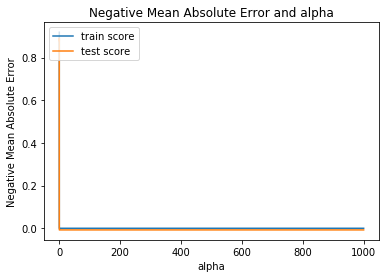

In [87]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')

plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [88]:
alpha = 0.001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 

Lasso(alpha=0.001)

In [89]:
lasso.coef_

array([-0.06309926,  0.06342582,  0.        ,  0.13179672,  0.        ,
        0.00810143,  0.        ,  0.00550391,  0.        ,  0.00549526,
        0.        ,  0.28649461,  0.00271999,  0.00560602,  0.        ,
       -0.        ,  0.43594684,  0.27337762,  0.00989162, -0.        ,
        0.04162263,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.01678718,  0.09416882,  0.        ,  0.08582318,
        0.        ,  0.01226873,  0.        , -0.01732707,  0.        ,
       -0.        ,  0.02062618,  0.05600541,  0.        ,  0.23448316,
        0.        , -0.        ,  0.91045365,  0.15861498,  0.        ,
        0.00424593,  0.02325218,  0.        , -0.        ,  0.0869101 ,
        0.06968205,  0.01469928,  0.079275  ,  0.00543587,  0.03747887,
        0.14474671,  0.        ,  0.        ,  0.02075836,  0.0303848 ,
        0.        ,  0.        ,  0.        ,  0.01235769, -0.        ,
       -0.        ,  0.        ,  0.        ,  0.        , -0.  

In [90]:
model_params_lasso = list(lasso.coef_)
model_params_lasso.insert(0,lasso.intercept_)
model_params_lasso = [round(x,3) for x in model_params_lasso]
cols = X_train.columns
cols = cols.insert(0,"constant")
lasso_list = list(zip(cols,model_params_lasso))
sorted(lasso_list, key=lambda x: abs(x[1]),reverse=True)[:15]

[('constant', 10.343),
 ('GrLivArea', 0.91),
 ('OverallQual', 0.436),
 ('Neighborhood', 0.286),
 ('OverallCond', 0.273),
 ('1stFlrSF', 0.234),
 ('BsmtFullBath', 0.159),
 ('GarageCars', 0.145),
 ('LotArea', 0.132),
 ('BsmtQual', 0.094),
 ('KitchenQual', 0.087),
 ('BsmtExposure', 0.086),
 ('FireplaceQu', 0.079),
 ('SaleCondition', 0.074),
 ('Functional', 0.07)]

In [91]:

y_train_pred = lasso.predict(X_train)
print(r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lasso.predict(X_test)
print(r2_score(y_true=y_test, y_pred=y_test_pred))

0.9057964343317857
0.8854039568785623


In [99]:
print(mean_squared_error(y_test, y_test_pred))
print(mean_absolute_error(y_test, y_test_pred))

0.01885564628885023
0.09327096490965915


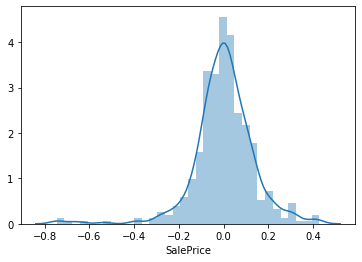

In [92]:
import seaborn as sns

sns.distplot(y_test-y_test_pred)

In [93]:
# Both has almost same R2 score

coef = pd.Series(lasso.coef_, index = X_train.columns)
var_selected = sum(coef != 0)
print('Lasso has selected {} variables'.format(var_selected))

Lasso has selected 38 variables


In [94]:
main_coef = pd.concat([coef.sort_values().head(10), coef.sort_values().tail(10)])
main_coef = main_coef.sort_values(ascending=False).head(10)
main_coef

GrLivArea       0.910454
OverallQual     0.435947
Neighborhood    0.286495
OverallCond     0.273378
1stFlrSF        0.234483
BsmtFullBath    0.158615
GarageCars      0.144747
LotArea         0.131797
BsmtQual        0.094169
KitchenQual     0.086910
dtype: float64

Text(0.5, 1.0, 'Lasso Model')

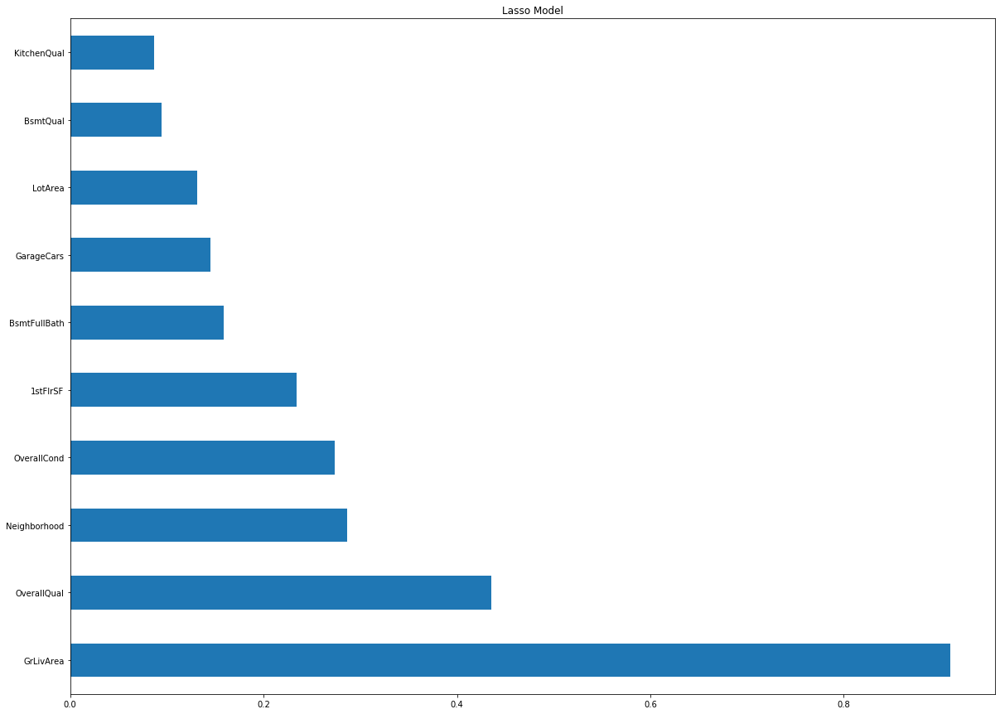

In [95]:
# Final Plot
plt.figure(figsize = (20,15))
main_coef.plot(kind = "barh")
plt.title("Lasso Model")

### Conclusion

In the model creation we used both Ridge and Lasso models 

Used Alpha param raning from 0.0001 to 1000 to check for metrics and get the optimal Alpha for Model building 

<b>Ridge Model:</b> Top 10 Features selected are 

                GrLivArea       0.440846
                1stFlrSF        0.395883
                OverallQual     0.373173
                OverallCond     0.258606
                Neighborhood    0.248240
                LotArea         0.179149
                GarageCars      0.152616
                2ndFlrSF        0.152461
                BsmtFullBath    0.147838
                TotalSqFt       0.121719
                
       R2 value : 
           Train: 0.9102596390715337
           Test : 0.8939448574601825
           
       Optimal Alpha : 3
       
       Mean Square Error   :0.01745032551189629
       Mean Absoulte Error :0.08920714694730007
       
<b>Lasso Model:</b> Top 10 Features selected are 
                
                GrLivArea       0.910454
                OverallQual     0.435947
                Neighborhood    0.286495
                OverallCond     0.273378
                1stFlrSF        0.234483
                BsmtFullBath    0.158615
                GarageCars      0.144747
                LotArea         0.131797
                BsmtQual        0.094169
                KitchenQual     0.086910
             
       R2 value :
           Train: 0.9057964343317857
           Test : 0.8854039568785623
           
       Optimal Alpha: 0.001
       
       Mean Square Error   :0.01885564628885023
       Mean Absoulte Error :0.09327096490965915
       
From the stats we can see both the Models performed well on test data 


       